# Openstreetmaps with networkx

In [14]:
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt
import geopandas as gpd
import folium


In [3]:
weight = "length"
M = ox.graph_from_place("Palo Alto, California, USA", network_type="drive")
orig = list(M.nodes)[0]
dest = list(M.nodes)[-1]
route = ox.shortest_path(M, orig, dest, weight=weight)

# explore graph edges interactively, with a simple one-liner
ox.graph_to_gdfs(M, nodes=False).explore()

## Common Tile Providers:
1. OpenStreetMap
2. Stamen Terrain
3. Stamen Toner
4. Stamen Watercolor
5. CartoDB Positron
6. CartoDB Dark Matter 
7. OpenTopoMap
8. Esri World Imagery

### Other Tile Providers:
1. Esri World Street Map
2. Esri DeLorme
3. Esri National Geographic
4. Hike & Bike
5. NASAGIBS.ViirsEarthAtNight2012

In [25]:
# Download the street network data
M = ox.graph_from_place("Palo Alto, California, USA", network_type="drive")

# Convert the graph edges to a GeoDataFrame
edges_gdf = ox.graph_to_gdfs(M, nodes=False)

# Explore the graph interactively with custom edge colors
edges_gdf.explore(tiles="Esri World Street Map")

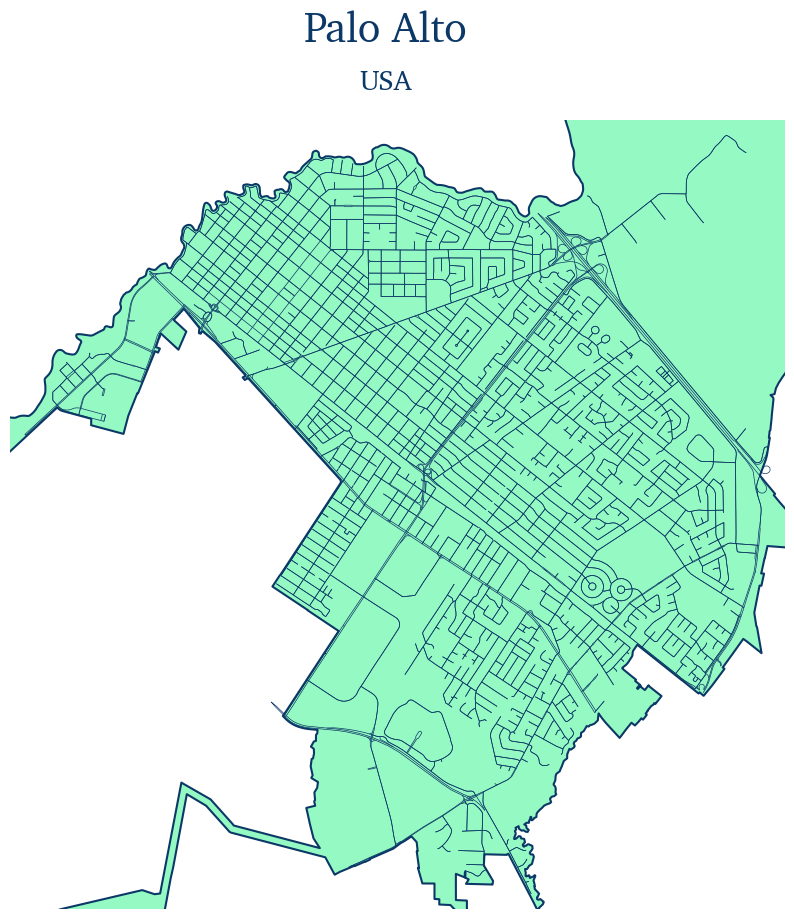

In [26]:
import osmnx as ox
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties, fontManager

# Define the color palette pairs
color_palette_actual = [
    ('#95f9c3', '#0b3866'), 
    ('#ff0f7b', '#f89b29'), 
    ('#6ff7e8', '#1f7ea1'),
    ('#45caff', '#ff1b6b'),  
    ('#f8acff', '#696eff'),  
    ('#9bafd9', '#103783'),  
    ('#f4f1de', '#e07a5f'), 
    ('#613232', '#ffc8c8'),  
    ('#f4f1de', '#e07a5f'),  
    ('#60efff', '#0061ff'),  
    ('#00f59b', '#7014f2'), 
    ('#07f49e', '#42047e'),  
    ('#faf0ca', '#0d3b66')   
]

# Set the font properties
font_properties_city = FontProperties(family='Charter', size=40)  # Font for city name
font_properties_country = FontProperties(family='Charter', size=20)  # Font for country name

# Specify the place name
place_name = "Palo Alto, California, USA"

# Split the place name into city and country
city, state, country = place_name.split(', ')
title_text = f"{city}\n{country}"

# Download the geometries data for the place
gdf = ox.geocode_to_gdf(place_name)

# Download the street network data for the place
graph = ox.graph_from_place(place_name, network_type='drive')

# Select a color pair (cycling through the list)
shape_color, edge_color = color_palette_actual[0]  # You can change the index to select different color pairs

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))
plt.subplots_adjust(top=0.92)  # Adjust to create space at the top

# Plot the geometries on the axis with the shape color
ax.set_facecolor('white')
gdf.plot(ax=ax, facecolor=shape_color, edgecolor=edge_color, linewidth=1.5)

# Plot the street network on the axis with the edge color
ox.plot_graph(graph, ax=ax, node_size=0, edge_color=edge_color, edge_linewidth=0.5, show=False, close=False)

# Add the city and country name above the visualization
fig.suptitle(city, fontsize=30, fontproperties=font_properties_city, color=edge_color, ha='center', y=1.02)
fig.text(0.5, 0.94, country, fontsize=20, fontproperties=font_properties_country, color=edge_color, ha='center')

# Save the plot to a file
filename = f'urban_shapes_{place_name.replace(", ", "_").replace(" ", "_")}_V03.png'
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

# Convert the graph edges to a GeoDataFrame
edges_gdf = ox.graph_to_gdfs(graph, nodes=False)

# Add a column for the edge color
edges_gdf["color"] = edge_color

# Explore the graph interactively with custom edge colors
edges_gdf.explore(edge_color="color", tiles="Esri World Street Map")


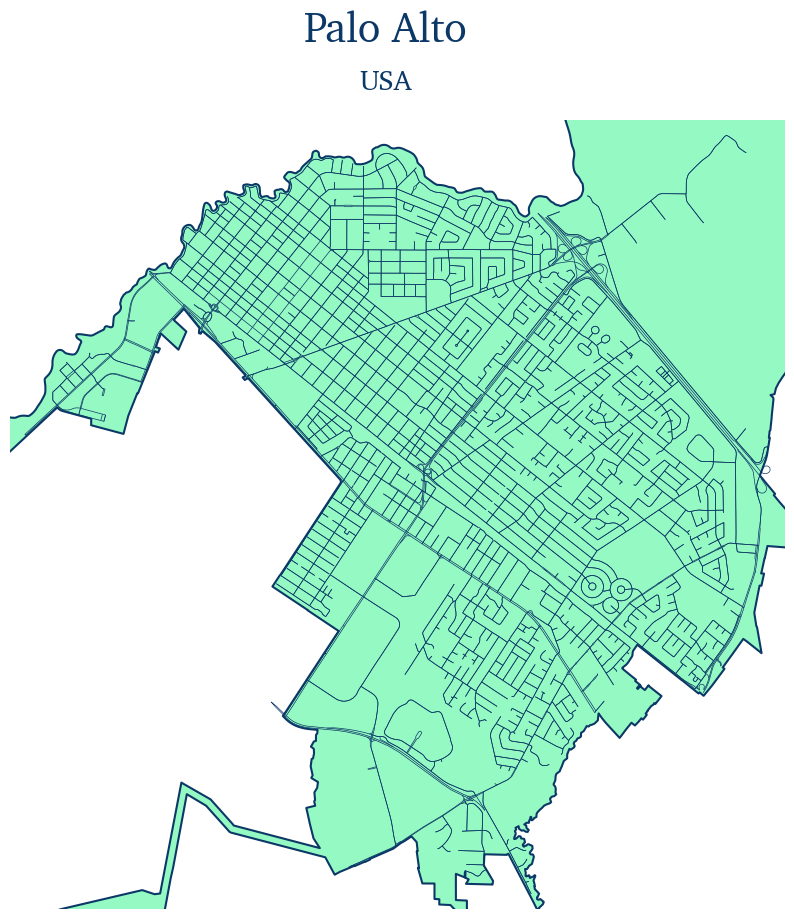

<Figure size 640x480 with 0 Axes>